In [1]:
import numpy as np
import sys
import os
import pandas as pd
import glob as glob
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.spatial.distance as sd
from scipy.io import loadmat
import timecorr as tc
from timecorr.helpers import reduce_wrapper, isfc, wisfc, mean_combine, corrmean_combine, vec2mat, folding_levels, decoder


%matplotlib inline

In [2]:
figdir = '../../figs'
if not os.path.isdir(figdir):
    os.mkdir('figs')
figdir = 'figs'

In [3]:
factors = 700

In [4]:
if factors == 100:
    pieman_name = '../../data/pieman_ica100.mat'
else:
    pieman_name = '../../data/pieman_data.mat'


In [5]:
pieman_data = loadmat(pieman_name)

In [6]:
pieman_conds = ['intact', 'paragraph', 'word', 'rest']

In [7]:
debug = False

In [8]:
if debug:
    data = []
    conds = []
    for c in pieman_conds:
        next_data = list(map(lambda i: pieman_data[c][:, i][0][:2000,:100], np.arange(4)))
        data.extend(next_data)
        conds.extend([c]*len(next_data))
    del pieman_data

else:

    data = []
    conds = []
    for c in pieman_conds:
        next_data = list(map(lambda i: pieman_data[c][:, i][0], np.arange(pieman_data[c].shape[1])))
        data.extend(next_data)
        conds.extend([c]*len(next_data))
    del pieman_data

In [9]:
all_data = np.array(data)
conds = np.array(conds)


## to figure out what's going on with paragraph, recreate the analysis:

In [10]:
cfun = isfc
rfun = 'PCA'
width = 5
wp = 'gaussian'
cond = 'intact'
level = 1

gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}

weights_paramter = eval(wp)


weights_fun=weights_paramter['weights']
weights_params=weights_paramter['params']
combine = corrmean_combine

## this group assignment led to a decoding accuracy of .45

In [11]:
group_assignments = np.array([0., 0., 1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 0., 0., 1., 0., 1.,
       0.])

In [12]:
cond = 'paragraph'

In [13]:
data = all_data[conds == cond]

In [14]:
i = 0
in_data = [x for x in data[group_assignments == i]]
out_data = [x for x in data[group_assignments != i]]
v=0
level=[0]
p_rfun=[None]
rfun = [rfun] * np.shape(level)[0]
combine = [combine] * np.shape(level)[0]
in_smooth, out_smooth, in_raw, out_raw = reduce_wrapper(folding_levels(in_data, out_data, level=v, cfun=None, rfun=p_rfun,
                        combine=combine, weights_fun=weights_fun,
                        weights_params=weights_params), level=v, rfun=rfun)

In [15]:
corrs = (1 - sd.cdist(in_raw, out_raw, 'correlation'))

In [16]:
results = decoder(corrs)

In [17]:
results

,rank,accuracy,error
0,0.979144,0.433824,0.088587


## plot correlations of corrmean combined raw in fold data and out fold data

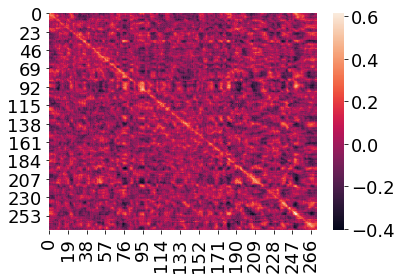

In [18]:
sns.heatmap(corrs)

In [19]:
corr = np.corrcoef(in_raw.T, out_raw.T)

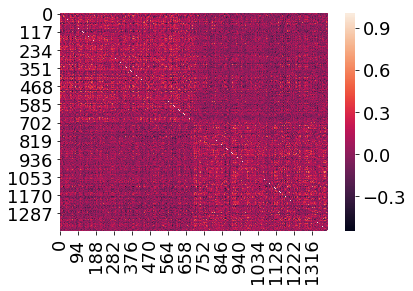

In [20]:
sns.heatmap(corr)

## plot participants txt correlation matrix in each group 

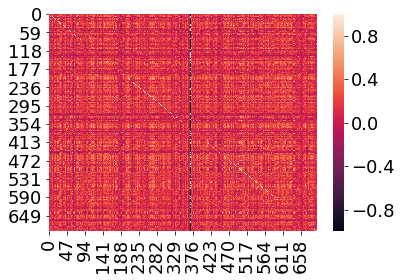

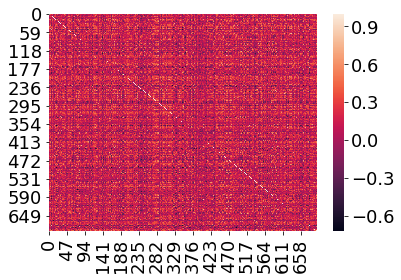

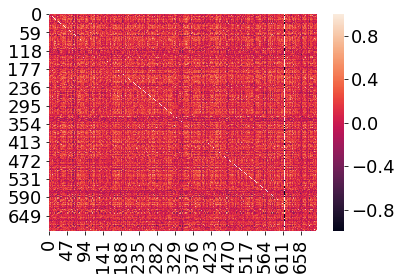

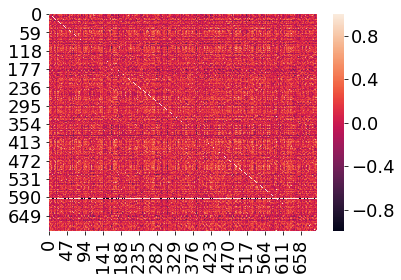

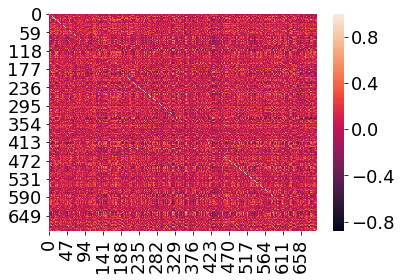

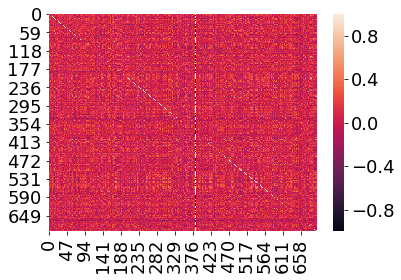

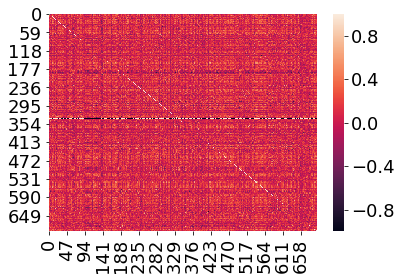

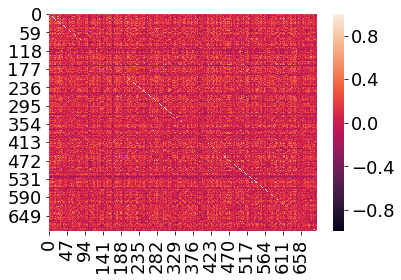

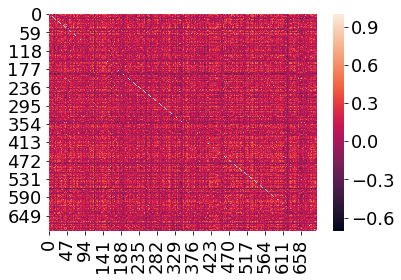

<Figure size 432x288 with 0 Axes>

In [21]:
for i in in_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()

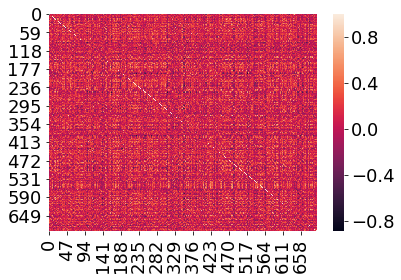

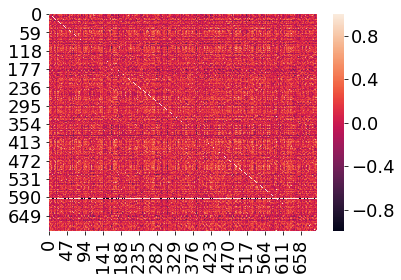

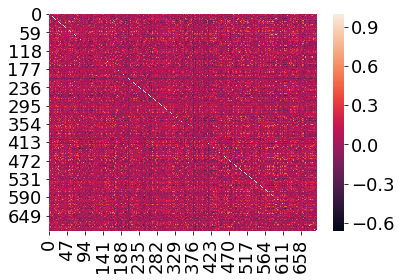

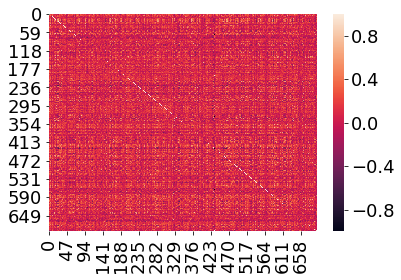

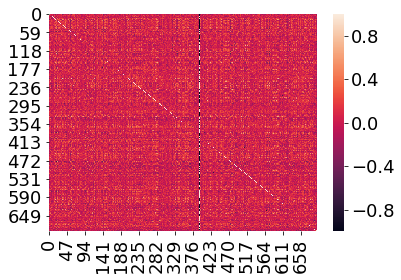

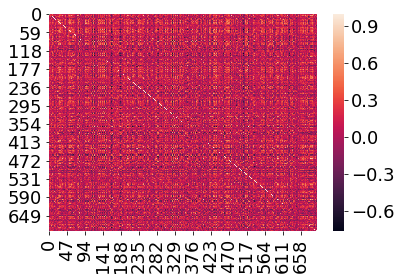

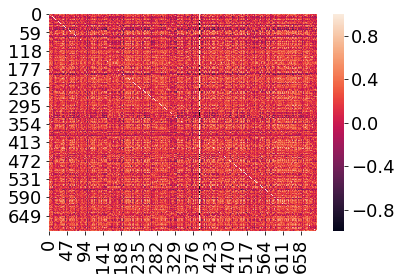

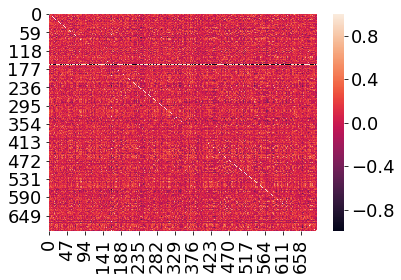

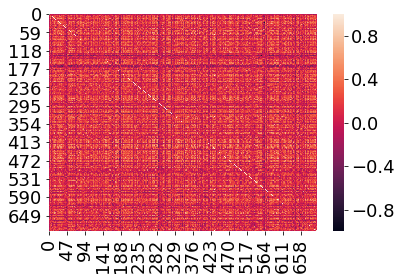

<Figure size 432x288 with 0 Axes>

In [22]:
for i in out_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()

## same thing for group assignment that led to accuracy of .15

In [23]:
group_assignments = np.array([0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1.,
       0.])

In [24]:
cond = 'paragraph'

In [ ]:
data = all_data[conds == cond]

In [26]:
cfun = isfc
rfun = 'PCA'
width = 5
wp = 'gaussian'
cond = 'intact'
level = 1

gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}

weights_paramter = eval(wp)


weights_fun=weights_paramter['weights']
weights_params=weights_paramter['params']
combine = corrmean_combine

In [27]:
i = 0
in_data = [x for x in data[group_assignments == i]]
out_data = [x for x in data[group_assignments != i]]
v=0
level=[0]
p_rfun=[None]
rfun = [rfun] * np.shape(level)[0]
combine = [combine] * np.shape(level)[0]
in_smooth, out_smooth, in_raw, out_raw = reduce_wrapper(folding_levels(in_data, out_data, level=v, cfun=None, rfun=p_rfun,
                        combine=combine, weights_fun=weights_fun,
                        weights_params=weights_params), level=v, rfun=rfun)

In [28]:
corrs = (1 - sd.cdist(in_raw, out_raw, 'correlation'))

In [29]:
results = decoder(corrs)

In [30]:
results

,rank,accuracy,error
0,0.934067,0.132353,0.170212


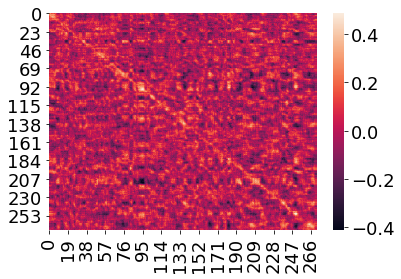

In [31]:
sns.heatmap(corrs)

In [32]:
corr = np.corrcoef(in_raw.T, out_raw.T)

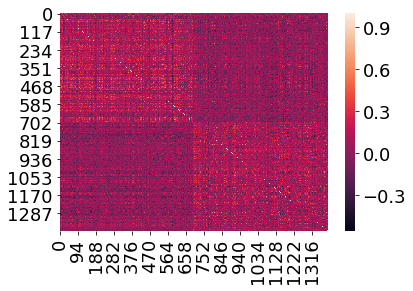

In [33]:
sns.heatmap(corr)

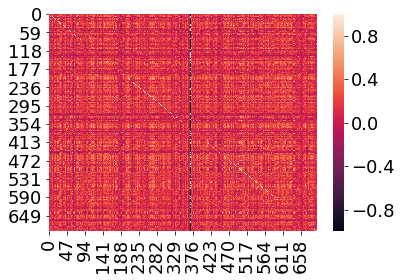

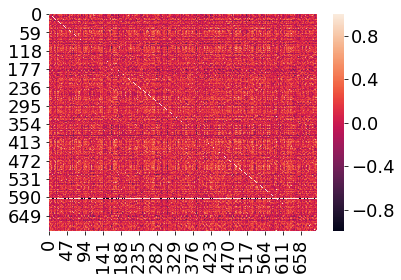

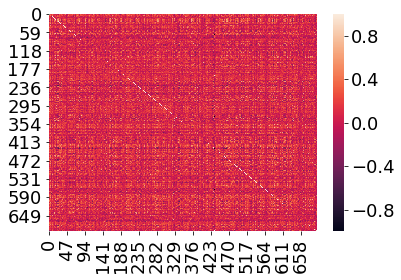

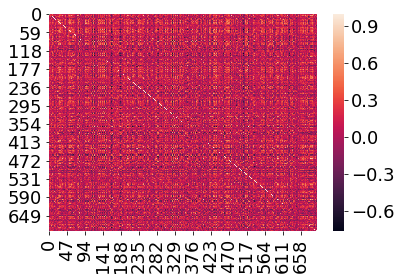

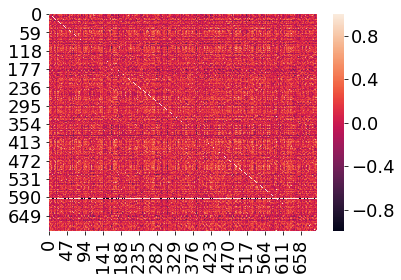

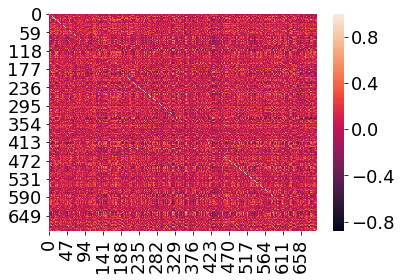

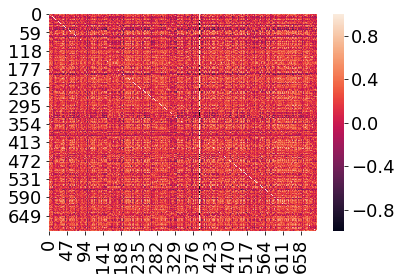

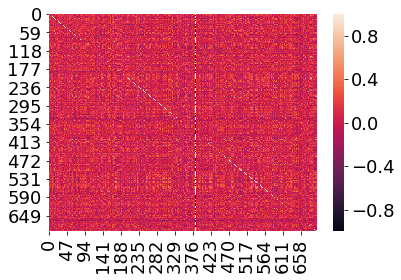

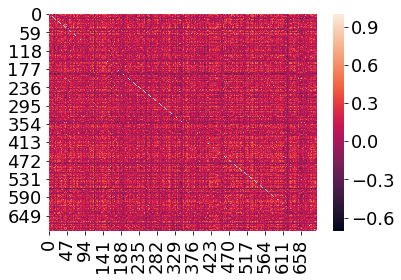

<Figure size 432x288 with 0 Axes>

In [34]:
for i in in_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()

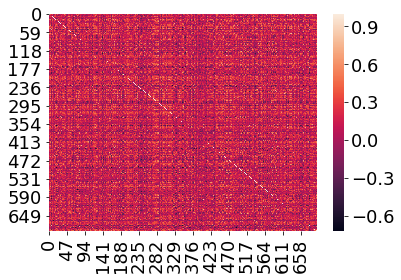

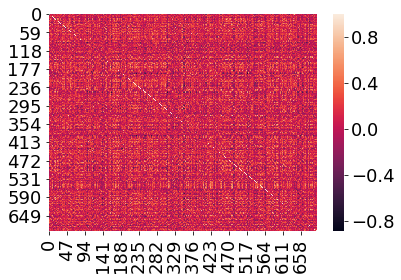

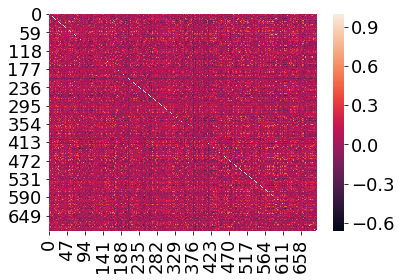

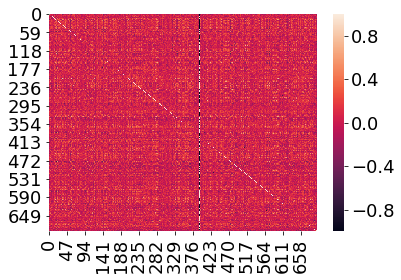

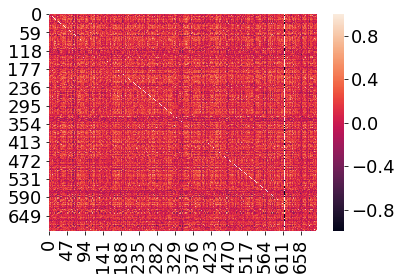

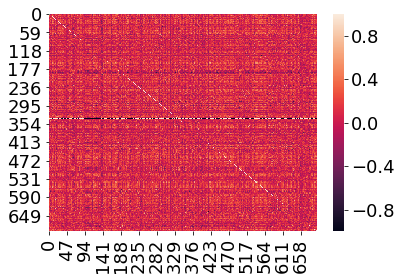

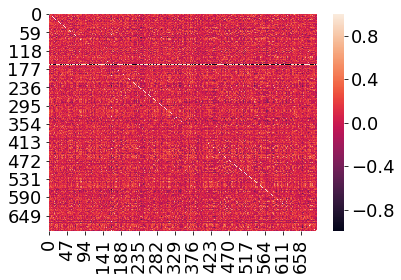

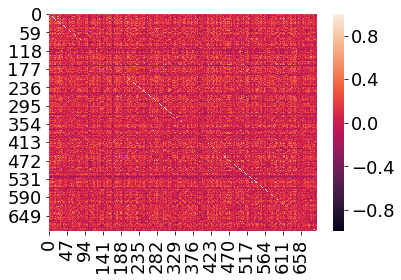

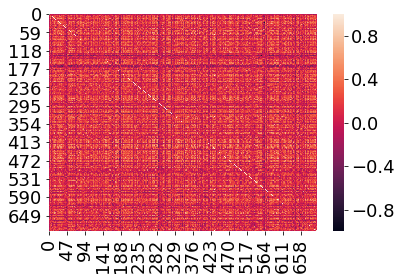

<Figure size 432x288 with 0 Axes>

In [35]:
for i in out_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()

In [36]:
## need to reshape data to 
#sns.heatmap(np.corrcoef(np.array(in_data).reshape((-1, 2)), np.array(out_data).reshape((-1, 2)))

In [37]:
#np.array(in_data).reshape((-1, 2)).shape

## What about with intact?


In [45]:
group_assignments = np.array([0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 0., 1., 0., 1., 0.])

In [46]:
cond = 'intact'

In [48]:
data = all_data[conds == cond]

In [49]:
cfun = isfc
rfun = 'PCA'
width = 5
wp = 'gaussian'
cond = 'intact'
level = 1

gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}

weights_paramter = eval(wp)


weights_fun=weights_paramter['weights']
weights_params=weights_paramter['params']
combine = corrmean_combine

In [50]:
i = 0
in_data = [x for x in data[group_assignments == i]]
out_data = [x for x in data[group_assignments != i]]
v=0
level=[0]
p_rfun=[None]
rfun = [rfun] * np.shape(level)[0]
combine = [combine] * np.shape(level)[0]
in_smooth, out_smooth, in_raw, out_raw = reduce_wrapper(folding_levels(in_data, out_data, level=v, cfun=None, rfun=p_rfun,
                        combine=combine, weights_fun=weights_fun,
                        weights_params=weights_params), level=v, rfun=rfun)

In [51]:
corrs = (1 - sd.cdist(in_raw, out_raw, 'correlation'))

In [52]:
results = decoder(corrs)

In [53]:
results

,rank,accuracy,error
0,0.966711,0.24,0.083622


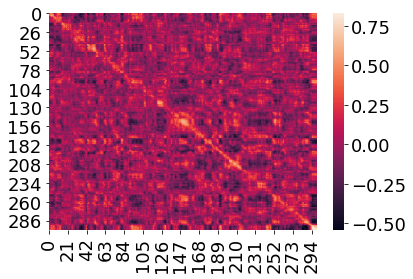

In [54]:
sns.heatmap(corrs)

In [55]:
corr = np.corrcoef(in_raw.T, out_raw.T)

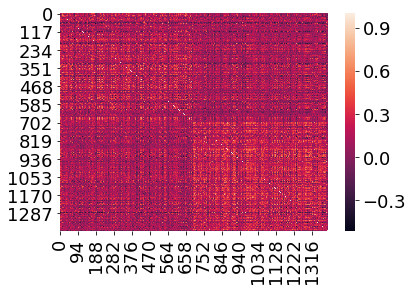

In [56]:
sns.heatmap(corr)

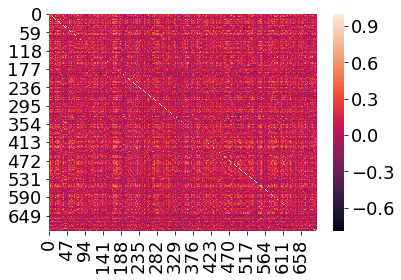

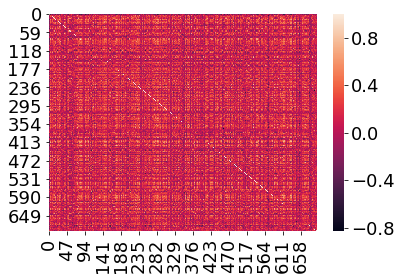

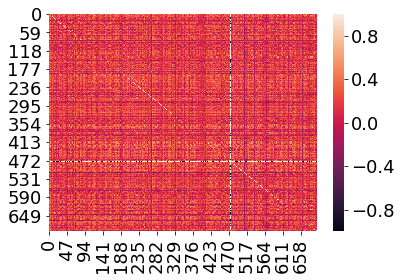

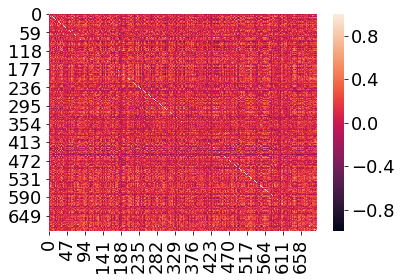

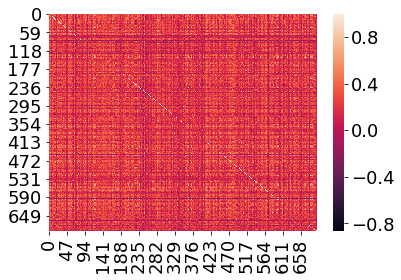

...

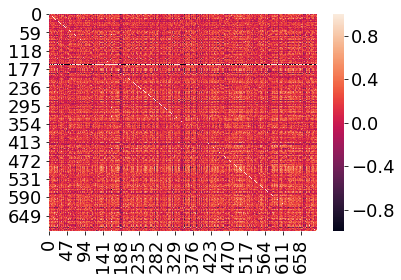

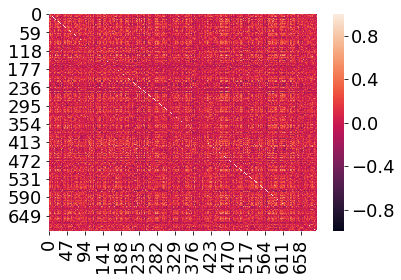

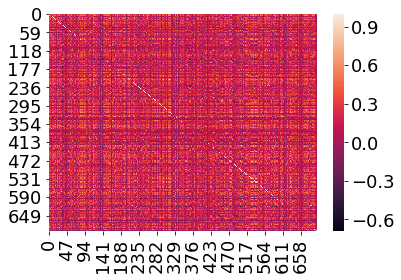

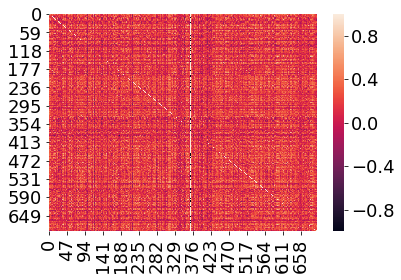

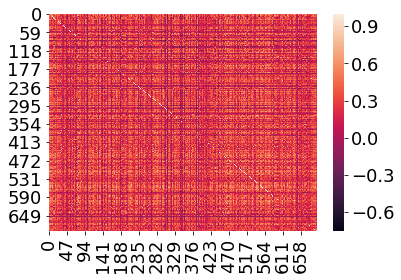

<Figure size 432x288 with 0 Axes>

In [57]:
for i in in_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()

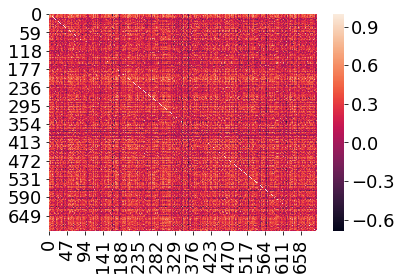

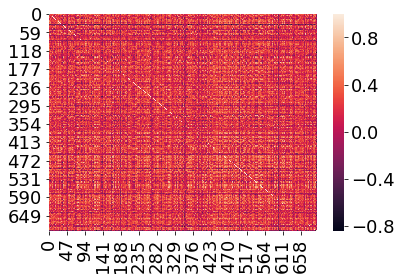

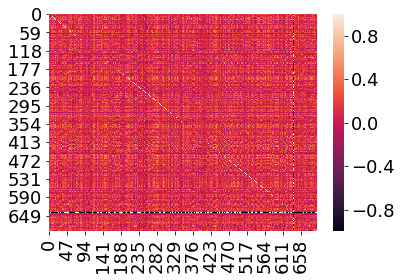

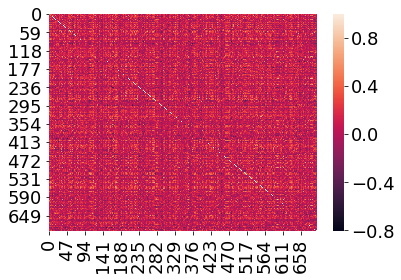

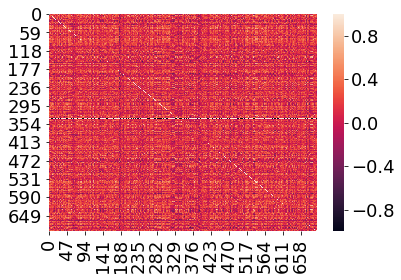

...

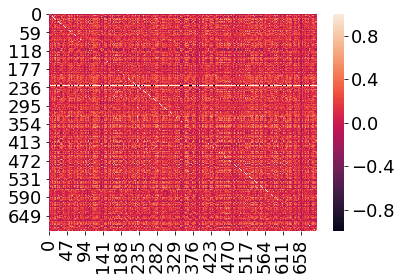

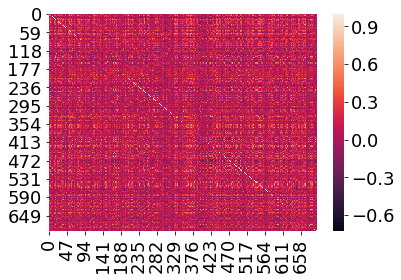

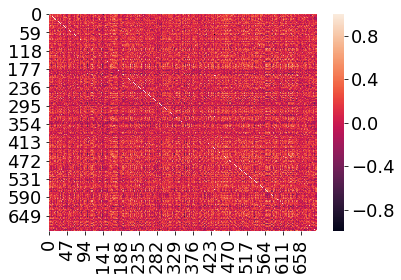

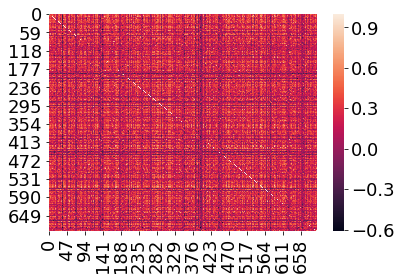

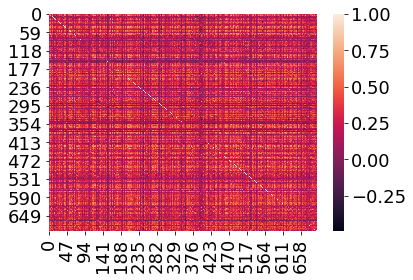

<Figure size 432x288 with 0 Axes>

In [58]:
for i in out_data:
    sns.heatmap(np.corrcoef(i.T))
    plt.show()
    plt.clf()